### Clusterization

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

In [2]:
data = pd.read_csv('quake.csv')
data

,Focal depth,Latitude,Longitude,Richter
0,33,-52.26,28.30,6.7
1,36,45.53,150.93,5.8
2,57,41.85,142.78,5.8
3,67,29.19,141.15,6.2
4,30,-21.66,169.81,6.0
...,...,...,...,...
2173,13,51.54,-173.11,5.8
2174,97,-10.16,161.01,5.9
2175,527,27.87,139.51,5.8
2176,51,36.43,140.98,6.0


### Проверка данных

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2178 entries, 0 to 2177
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Focal depth  2178 non-null   int64  
 1   Latitude     2178 non-null   float64
 2   Longitude    2178 non-null   float64
 3   Richter      2178 non-null   float64
dtypes: float64(3), int64(1)
memory usage: 68.2 KB


Проверим, что широта и долгота не выходят за допустимые значения, а шкала Рихтера принимает возможные значения для Земли

In [4]:
for index, row in data.iterrows():
    if (row['Richter'] >= 9.5
       or not -90 <= row['Latitude'] <= 90
       or not -180 < row['Longitude'] <= 180): 
        data = data.drop(index)

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2178 entries, 0 to 2177
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Focal depth  2178 non-null   int64  
 1   Latitude     2178 non-null   float64
 2   Longitude    2178 non-null   float64
 3   Richter      2178 non-null   float64
dtypes: float64(3), int64(1)
memory usage: 68.2 KB


In [6]:
X = data

In [8]:
dict_richter={'cnt':[0]*x for x in range(4)}
for index, row in X.iterrows():
    if (row['Richter'] <= 3):
        dict_richter['cnt'][0] += 1 
    elif (row['Richter'] <= 7):
        dict_richter['cnt'][1] += 1 
    else:
        dict_richter['cnt'][2] += 1 
        
dict_focal_depth={'cnt':[0]*x for x in range(4)}
for index, row in X.iterrows():
    if (row['Focal depth'] <= 100):
        dict_focal_depth['cnt'][0] += 1 
    elif (row['Focal depth'] <= 300):
        dict_focal_depth['cnt'][1] += 1 
    else:
        dict_focal_depth['cnt'][2] += 1 

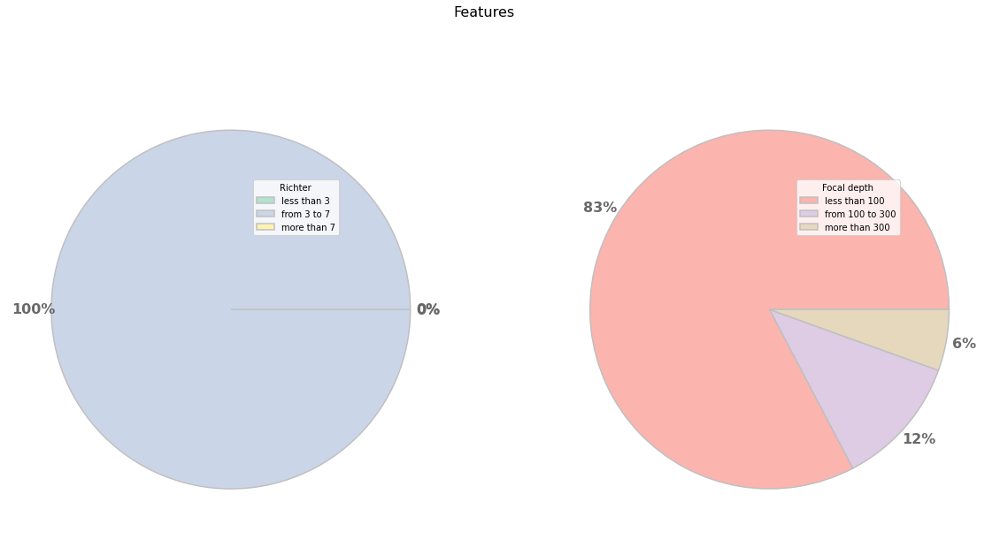

In [9]:
from matplotlib import cm
cs1=cm.Pastel2(np.arange(3)/3.)
cs2=cm.Pastel1(np.arange(3)/3.)
fig, ax = plt.subplots(figsize=(20, 10), ncols=2)
fig.suptitle('Features', fontsize = 16)

pie_1 = ax[0].pie( x=dict_richter['cnt'], autopct='%.0f%%',
                  wedgeprops={ 'linewidth' : 1.5, 'edgecolor' : "silver" }, colors=cs1, textprops=dict(color="dimgrey"), pctdistance=1.1)
ax[0].legend(pie_1[0],
             ['less than 3','from 3 to 7','more than 7'],
             title="Richter",
            bbox_to_anchor=(0.75, 0.8))

plt.setp(pie_1[2], size=16, weight="bold")
pie_2 = ax[1].pie(x=dict_focal_depth['cnt'], autopct='%.0f%%',
                  wedgeprops={ 'linewidth' : 1.5, 'edgecolor' : "silver" }, colors=cs2, textprops=dict(color="dimgrey"), pctdistance=1.1)
ax[1].legend(pie_2[0],
             ['less than 100','from 100 to 300','more than 300'],
             title="Focal depth",
             bbox_to_anchor=(0.8, 0.8))
plt.setp(pie_2[2], size=16, weight="bold")
             
plt.show()

По шкале Рихтера получилась только одна группа, поэтому посмотрим минимальный и максимальный элементы. <br>
Так же отметим, что большинство землетрясений были на глубине меньше 100 км.

In [12]:
print(f"MIN: {X['Richter'].min()}, MAX: {X['Richter'].max()}")

MIN: 5.8, MAX: 6.9


Видим, что данные включают землетрясения примерно одинаковой силы, поэтому возможно в кластерах этот признак будет меньше влиять

### Clusterization

In [7]:
import warnings
warnings.filterwarnings('ignore')

#### Hierarchycal clusterization

In [8]:
import scipy.cluster.hierarchy as h
from sklearn.metrics import silhouette_score
import time

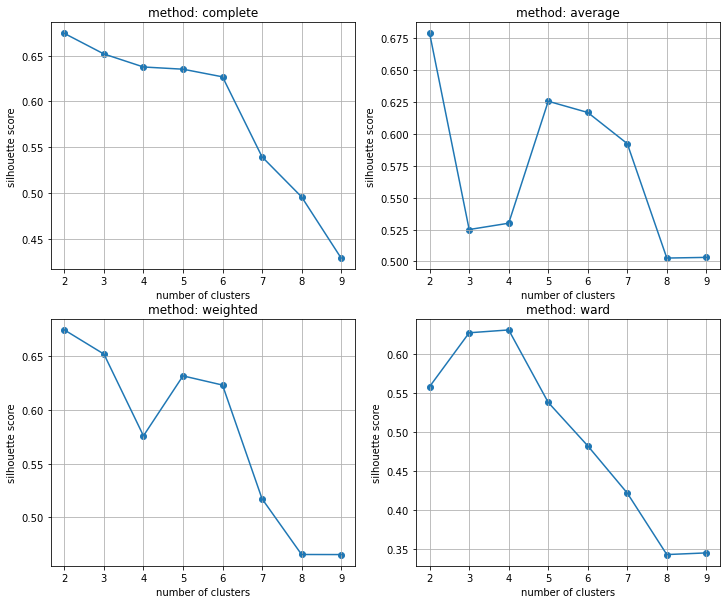

In [9]:
methods = ['complete', 'average', 'weighted', 'ward']
number_of_clusters = [i for i in range(2, 10)]
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
total_silh_scores = []
for i in range(len(methods)):
    silh_scores = []
    for num in number_of_clusters:
        Z = h.linkage(X, method=methods[i])
        labels = h.fcluster(Z, t=num, criterion='maxclust')
        silh_scores.append(silhouette_score(X, labels))
    total_silh_scores.append(silh_scores)    
    
for i in range(2):
    for j in range(2):
        axs[i][j].plot(number_of_clusters, total_silh_scores[2*i + j])
        axs[i][j].scatter(number_of_clusters, total_silh_scores[2*i + j])
        axs[i][j].set_title(f'method: {methods[2*i + j]}')
        axs[i][j].set(xlabel='number of clusters', ylabel="silhouette score")
        axs[i][j].grid()
plt.show()


<img src="http://drive.google.com/uc?export=view&id=1HdaqVAT4tRbq8gAiDrsJfDpZfKVOTIJd" width="300">

По методу каменной осыпи:<br>
 - для метода "complete" количество кластеров = 4
 - для метода "average" количество кластеров = 3
 - для метода "weighted" количество кластеров = 4
 - для метода "ward" количество кластеров = 2

METHOD: complete NUMBER OF CLUSTERS: 4
silhouette_score: 0.6376354025503924

METHOD: average NUMBER OF CLUSTERS: 3
silhouette_score: 0.5250109345396419

METHOD: weighted NUMBER OF CLUSTERS: 4
silhouette_score: 0.5758512363811389

METHOD: ward NUMBER OF CLUSTERS: 2
silhouette_score: 0.5581817818373536



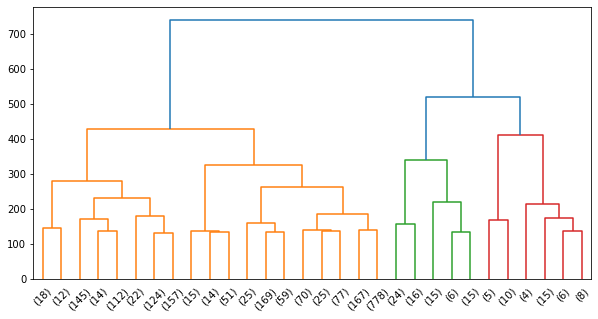

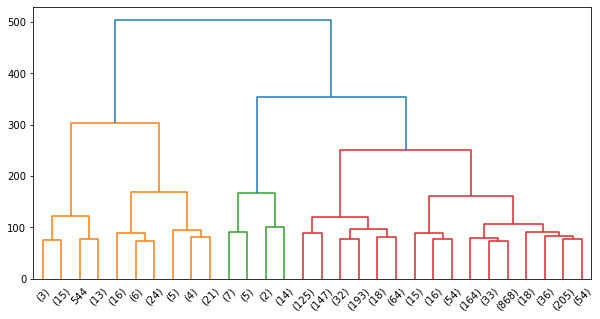

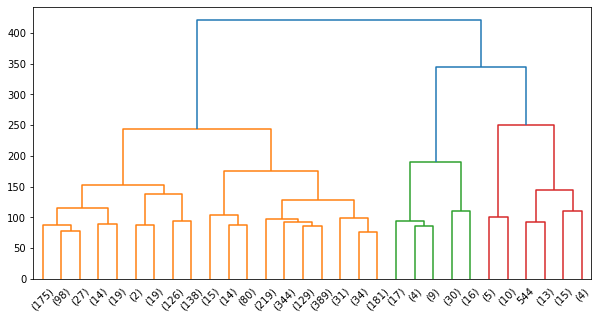

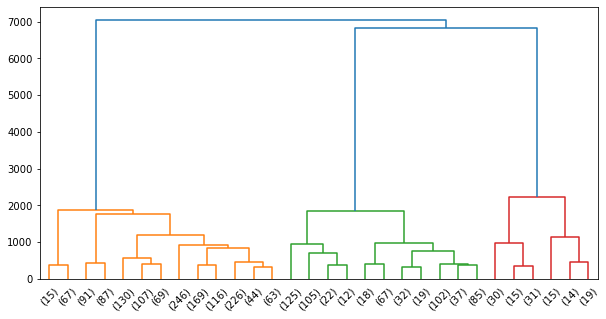

In [10]:
methods = [(4, 'complete'), (3, 'average'), (4, 'weighted'), (2, 'ward')]
hierarchy_results = {}
results_time = {'time':[]}
statistic = []

for method in methods:
    print(f'METHOD: {method[1]} NUMBER OF CLUSTERS: {method[0]}') 
    start_time = time.time()
    h.fclusterdata(X, t=method[0], method=method[1], criterion='maxclust')
    Z = h.linkage(X, method=method[1])
    labels = h.fcluster(Z, t=method[0], criterion='maxclust')
    results_time['time'].append(time.time() - start_time)
    plt.figure(figsize=(10,5))
    _ = h.dendrogram(Z, truncate_mode='lastp')
    print(f'silhouette_score: {silhouette_score(X, labels)}\n')
    hierarchy_results[method[1]] = (method[0], silhouette_score(X, labels), labels)

Из дендрограмм видно, что для иерархической кластеризации оптимальное кол-во кластеров = 3

### DRAW CLUSTERIZED DATA

Выбрали method = complete, так как лучший silhouette score

In [11]:
labels_to_draw = hierarchy_results['complete'][2]

In [12]:
import branca.colormap as cm
import colorsys
import webcolors
import folium

In [13]:
max_depth = 700

In [14]:
def get_hsv(hexrgb):
    hexrgb = hexrgb.lstrip("#")   # in case you have Web color specs
    r, g, b = (int(hexrgb[i:i+2], 16) / 255.0 for i in range(0,5,2))
    return colorsys.rgb_to_hsv(r, g, b)[2]

In [15]:
def first_color(ind, mul, colors):
    if ind == [1]: 
        r = 154
        g = 234
        b = 188
    elif ind == [2]:
        r = 162
        g = 161
        b = 255
    elif ind == [3]:
        r = 255
        g = 161
        b = 207
    elif ind == [4]:
        r = 254
        g = 255
        b = 161  
    else:
        return
    hsv = colorsys.rgb_to_hsv(r, g, b)
    if mul > 0:
        rgb = colorsys.hsv_to_rgb(hsv[0], hsv[1], hsv[2]-mul/6)
    else:    
        rgb = colorsys.hsv_to_rgb(hsv[0], hsv[1], hsv[2])
    n_hex = webcolors.rgb_to_hex((round(rgb[0]), round(rgb[1]), round(rgb[2])))    
    colors[f'Group_{ind}'][0].append(n_hex)
    if mul > colors[f'Group_{ind}'][1]:
        colors[f'Group_{ind}'][1] = mul
    if mul < colors[f'Group_{ind}'][2]:
        colors[f'Group_{ind}'][2] = mul
    return n_hex

In [16]:
colors={'Group_[1]':[[],0,max_depth],'Group_[2]':[[],0,max_depth],
        'Group_[3]':[[],0,max_depth],'Group_[4]':[[],0,max_depth]}
fg={'Group_[1]':[],'Group_[2]':[], 'Group_[3]':[],'Group_[4]':[]}
m = folium.Map(tiles="OpenStreetMap", zoom_start=2, zoom_control=False)

for i in range(1, max(labels_to_draw)+1):
    fg[f'Group_[{i}]'] = folium.FeatureGroup(name=f'Group_{i}')
for i in range(0,len(labels_to_draw)):
    folium.Circle(
      location=[data.iloc[i]['Latitude'], data.iloc[i]['Longitude']],
      radius=data.iloc[i]['Richter']*15000,  
      color=first_color([labels_to_draw[i]], data.iloc[i]['Focal depth'], colors),
      fill=True,
      fill_color=first_color([labels_to_draw[i]], data.iloc[i]['Focal depth'], colors)
   ).add_to(fg[f'Group_[{labels_to_draw[i]}]'])

for i in range(1, max(labels_to_draw)+1):
    colors[f'Group_[{i}]'][0] = list(set(colors[f'Group_[{i}]'][0]))
    colors[f'Group_[{i}]'][0].sort(key=get_hsv)
    colors[f'Group_[{i}]'][0].reverse()
    colormap = cm.StepColormap(colors[f'Group_[{i}]'][0], index=None, 
                               vmin=colors[f'Group_[{i}]'][2], vmax=colors[f'Group_[{i}]'][1])
    colormap.caption = f'Group_{i}'

    m.add_child(colormap)
    m.add_child(fg[f'Group_[{i}]'])

folium.map.LayerControl('bottomleft', collapsed= False).add_to(m)
   
m

Как видно по карте, землетрясения разбиваются на 4 кластера: по полушариям (западное и восточно), и в этих полушариях также подразбиваются по глубине землетрясения (по карте видно, что более темные точки (цветом показывается глубина землетрясения - чем темнее точка, тем больше была глубина)).

# KMEANS

In [18]:
from sklearn.cluster import KMeans

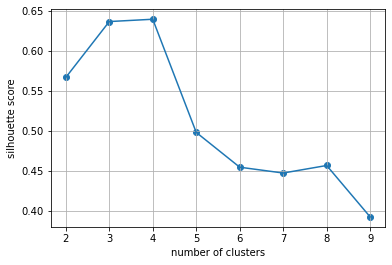

In [19]:
number_of_clusters = [i for i in range(2, 10)]
silh_scores = []
for n in number_of_clusters:
    kmeans = KMeans(n_clusters=n).fit(X)
    labels = kmeans.predict(X)
    silh_scores.append(silhouette_score(X, labels))
plt.xlabel('number of clusters')
plt.ylabel('silhouette score')
plt.plot(number_of_clusters, silh_scores)
plt.scatter(number_of_clusters, silh_scores)
plt.grid()
plt.show()

По методу каменной осыпи кластера 2

Построим график для 2-х кластеров

In [62]:
labels_kmeans = []

start_time = time.time()
kmeans = KMeans(n_clusters=2).fit(X)
labels_kmeans_2_clust = kmeans.predict(X)
results_time['time'].append(time.time() - start_time)

colors={'Group_[1]':[[],0,max_depth],'Group_[2]':[[],0,max_depth],
        'Group_[3]':[[],0,max_depth],'Group_[4]':[[],0,max_depth]}
fg={'Group_[1]':[],'Group_[2]':[], 'Group_[3]':[],'Group_[4]':[]}

m = folium.Map(tiles="OpenStreetMap", zoom_start=2, zoom_control=False)
for i in range(1, max(labels_to_draw)+1):
    fg[f'Group_[{i}]'] = folium.FeatureGroup(name=f'Group_{i}')
    
for i in range(0,len(labels_kmeans_2_clust)):         
    folium.Circle(
      location=[data.iloc[i]['Latitude'], data.iloc[i]['Longitude']],
      radius=data.iloc[i]['Richter']*15000,  
      color=first_color([labels_kmeans_2_clust[i]+1], data.iloc[i]['Focal depth'], colors),
      fill=True,
      fill_color=first_color([labels_kmeans_2_clust[i]+1], data.iloc[i]['Focal depth'], colors)
   ).add_to(fg[f'Group_[{labels_kmeans_2_clust[i]+1}]'])

labels_kmeans.append(labels_kmeans_2_clust)

for i in range(1, max(labels_kmeans_2_clust)+2):
    colors[f'Group_[{i}]'][0] = list(set(colors[f'Group_[{i}]'][0]))
    colors[f'Group_[{i}]'][0].sort(key=get_hsv)
    colors[f'Group_[{i}]'][0].reverse()
    colormap = cm.StepColormap(colors[f'Group_[{i}]'][0], index=None, 
                               vmin=colors[f'Group_[{i}]'][2], vmax=colors[f'Group_[{i}]'][1])
    colormap.caption = f'Group_{i}'
    colormap.add_to(m) 
    m.add_child(fg[f'Group_[{i}]'])
    
folium.map.LayerControl('bottomleft', collapsed= False).add_to(m)    
m

Здесь точки землетрясений разбиваются на два кластера по своему расположению в полушариях - восточному и западному

Построим график для 3-х кластеров

In [63]:
start_time = time.time()
kmeans = KMeans(n_clusters=3).fit(X)
labels_kmeans_3_clust = kmeans.predict(X)
results_time['time'].append(time.time() - start_time)

m = folium.Map(tiles="OpenStreetMap", zoom_start=2)
colors={'Group_[1]':[[],0,max_depth],'Group_[2]':[[],0,max_depth],
        'Group_[3]':[[],0,max_depth],'Group_[4]':[[],0,max_depth]}
fg={'Group_[1]':[],'Group_[2]':[], 'Group_[3]':[],'Group_[4]':[]}

m = folium.Map(tiles="OpenStreetMap", zoom_start=2, zoom_control=False)
for i in range(1, max(labels_to_draw)+1):
    fg[f'Group_[{i}]'] = folium.FeatureGroup(name=f'Group_{i}')

for i in range(0,len(labels_kmeans_3_clust)):         
    folium.Circle(
      location=[data.iloc[i]['Latitude'], data.iloc[i]['Longitude']],
      radius=data.iloc[i]['Richter']*15000,  
      color=first_color([labels_kmeans_3_clust[i]+1], data.iloc[i]['Focal depth'], colors),
      fill=True,
      fill_color=first_color([labels_kmeans_3_clust[i]+1], data.iloc[i]['Focal depth'], colors)
   ).add_to(fg[f'Group_[{labels_kmeans_3_clust[i]+1}]'])

labels_kmeans.append(labels_kmeans_3_clust)
for i in range(1, max(labels_kmeans_3_clust)+2):
    colors[f'Group_[{i}]'][0] = list(set(colors[f'Group_[{i}]'][0]))
    colors[f'Group_[{i}]'][0].sort(key=get_hsv)
    colors[f'Group_[{i}]'][0].reverse()
    colormap = cm.StepColormap(colors[f'Group_[{i}]'][0], index=None, 
                               vmin=colors[f'Group_[{i}]'][2], vmax=colors[f'Group_[{i}]'][1])
    colormap.caption = f'Group_{i}'
    m.add_child(fg[f'Group_[{i}]'])
    colormap.add_to(m) 

folium.map.LayerControl('bottomleft', collapsed= False).add_to(m)  
m

При увеличении количества кластеров на один, выделяется тот, в котором находятся точки с большей глубиной землятрясения(но сразу для обоих полушарий)

Построим график для 4-х кластеров

In [65]:
start_time = time.time()
kmeans = KMeans(n_clusters=4).fit(X)
labels_kmeans_4_clust = kmeans.predict(X)
results_time['time'].append(time.time() - start_time)

m = folium.Map(tiles="OpenStreetMap", zoom_start=2)
colors={'Group_[1]':[[],0,max_depth],'Group_[2]':[[],0,max_depth],
        'Group_[3]':[[],0,max_depth],'Group_[4]':[[],0,max_depth]}

fg={'Group_[1]':[],'Group_[2]':[], 'Group_[3]':[],'Group_[4]':[]}

m = folium.Map(tiles="OpenStreetMap", zoom_start=2, zoom_control=False)
for i in range(1, max(labels_to_draw)+1):
    fg[f'Group_[{i}]'] = folium.FeatureGroup(name=f'Group_{i}')

for i in range(0,len(labels_kmeans_4_clust)):         
    folium.Circle(
      location=[data.iloc[i]['Latitude'], data.iloc[i]['Longitude']],
      radius=data.iloc[i]['Richter']*15000,  
      color=first_color([labels_kmeans_4_clust[i]+1], data.iloc[i]['Focal depth'], colors),
      fill=True,
      fill_color=first_color([labels_kmeans_4_clust[i]+1], data.iloc[i]['Focal depth'], colors)
   ).add_to(fg[f'Group_[{labels_kmeans_4_clust[i]+1}]'])

labels_kmeans.append(labels_kmeans_4_clust)
for i in range(1, max(labels_kmeans_4_clust)+2):
    colors[f'Group_[{i}]'][0] = list(set(colors[f'Group_[{i}]'][0]))
    colors[f'Group_[{i}]'][0].sort(key=get_hsv)
    colors[f'Group_[{i}]'][0].reverse()
    colormap = cm.StepColormap(colors[f'Group_[{i}]'][0], index=None, 
                               vmin=colors[f'Group_[{i}]'][2], vmax=colors[f'Group_[{i}]'][1])
    colormap.caption = f'Group_{i}'
    m.add_child(fg[f'Group_[{i}]'])
    colormap.add_to(m)
    
folium.map.LayerControl('bottomleft', collapsed= False).add_to(m)  
m

При увеличении количества кластеров еще на один, точки с большей глубиной землятрясения также начинают делиться по нахождению на полушарии

# EM

In [26]:
from sklearn.mixture import GaussianMixture

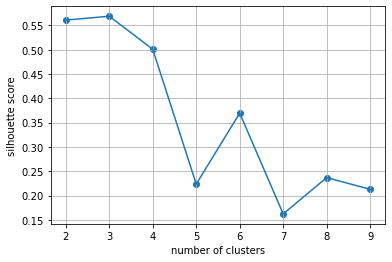

In [27]:
number_of_clusters = [i for i in range(2, 10)]
silh_scores = []
for n in number_of_clusters:
    em = GaussianMixture(n_components=n).fit(X)
    labels = em.predict(X)
    silh_scores.append(silhouette_score(X, labels))
plt.xlabel('number of clusters')
plt.ylabel('silhouette score')
plt.plot(number_of_clusters, silh_scores)
plt.scatter(number_of_clusters, silh_scores)
plt.grid()
plt.show()

Для EM кластеризации оптимальное число кластеров 2 (по методу каменной осыпи)

Построим график для 2-х кластеров

In [67]:
labels_em = []

start_time = time.time()
em = GaussianMixture(n_components=2).fit(X)
labels_em_2_clust = em.predict(X)
results_time['time'].append(time.time() - start_time)

m = folium.Map(tiles="OpenStreetMap", zoom_start=2)
colors={'Group_[1]':[[],0,max_depth],'Group_[2]':[[],0,max_depth],
        'Group_[3]':[[],0,max_depth],'Group_[4]':[[],0,max_depth]}

fg={'Group_[1]':[],'Group_[2]':[], 'Group_[3]':[],'Group_[4]':[]}

m = folium.Map(tiles="OpenStreetMap", zoom_start=2, zoom_control=False)
for i in range(1, max(labels_to_draw)+1):
    fg[f'Group_[{i}]'] = folium.FeatureGroup(name=f'Group_{i}')

for i in range(0,len(labels_em_2_clust)):         
    folium.Circle(
      location=[data.iloc[i]['Latitude'], data.iloc[i]['Longitude']],
      radius=data.iloc[i]['Richter']*15000,  
      color=first_color([labels_em_2_clust[i]+1], data.iloc[i]['Focal depth'], colors),
      fill=True,
      fill_color=first_color([labels_em_2_clust[i]+1], data.iloc[i]['Focal depth'], colors)
   ).add_to(fg[f'Group_[{labels_em_2_clust[i]+1}]'])

labels_em.append(labels_em_2_clust)
for i in range(1, max(labels_em_2_clust)+2):
    colors[f'Group_[{i}]'][0] = list(set(colors[f'Group_[{i}]'][0]))
    colors[f'Group_[{i}]'][0].sort(key=get_hsv)
    colors[f'Group_[{i}]'][0].reverse()
    colormap = cm.StepColormap(colors[f'Group_[{i}]'][0], index=None, 
                               vmin=colors[f'Group_[{i}]'][2], vmax=colors[f'Group_[{i}]'][1])
    colormap.caption = f'Group_{i}'
    m.add_child(fg[f'Group_[{i}]'])
    colormap.add_to(m)
    
folium.map.LayerControl('bottomleft', collapsed= False).add_to(m)  
m

Точки разбиваются на кластеры по глубине, что видно по цвету точек

Построим график для 3-х кластеров

In [71]:
start_time = time.time()
em = GaussianMixture(n_components=3).fit(X)
labels_em_3_clust = em.predict(X)
results_time['time'].append(time.time() - start_time)

m = folium.Map(tiles="OpenStreetMap", zoom_start=2)
colors={'Group_[1]':[[],0,max_depth],'Group_[2]':[[],0,max_depth],
        'Group_[3]':[[],0,max_depth],'Group_[4]':[[],0,max_depth]}

fg={'Group_[1]':[],'Group_[2]':[], 'Group_[3]':[],'Group_[4]':[]}

m = folium.Map(tiles="OpenStreetMap", zoom_start=2, zoom_control=False)
for i in range(1, max(labels_to_draw)+1):
    fg[f'Group_[{i}]'] = folium.FeatureGroup(name=f'Group_{i}')

for i in range(0,len(labels_em_3_clust)):         
    folium.Circle(
      location=[data.iloc[i]['Latitude'], data.iloc[i]['Longitude']],
      radius=data.iloc[i]['Richter']*15000,  
      color=first_color([labels_em_3_clust[i]+1], data.iloc[i]['Focal depth'], colors),
      fill=True,
      fill_color=first_color([labels_em_3_clust[i]+1], data.iloc[i]['Focal depth'], colors)
   ).add_to(fg[f'Group_[{labels_em_3_clust[i]+1}]'])

labels_em.append(labels_em_3_clust)
for i in range(1, max(labels_em_3_clust)+2):
    colors[f'Group_[{i}]'][0] = list(set(colors[f'Group_[{i}]'][0]))
    colors[f'Group_[{i}]'][0].sort(key=get_hsv)
    colors[f'Group_[{i}]'][0].reverse()
    colormap = cm.StepColormap(colors[f'Group_[{i}]'][0], index=None, 
                               vmin=colors[f'Group_[{i}]'][2], vmax=colors[f'Group_[{i}]'][1])
    colormap.caption = f'Group_{i}'
    m.add_child(fg[f'Group_[{i}]'])
    colormap.add_to(m)
    
folium.map.LayerControl('bottomleft', collapsed= False).add_to(m)  
m

При количестве кластеров = 3, снова выделяется кластер точек с большой глубиной, а точки с маленькой глубиной разбиваются по полушариям

# HDBSCAN

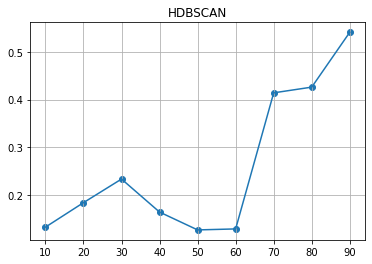

In [32]:
from hdbscan import HDBSCAN

min_cluster_sizes = [i for i in range(10, 100, 10)]
silh_scores = []

for n in min_cluster_sizes:
    labels = HDBSCAN(min_cluster_size = n).fit_predict(X)
    silh_scores.append(silhouette_score(X, labels))
plt.title("HDBSCAN")    
plt.plot(min_cluster_sizes, silh_scores)
plt.scatter(min_cluster_sizes, silh_scores)
plt.grid()
plt.show()

Здесь было решено взять минимальное кол-во точек в кластере = 90, потому что так получился больший silhouette_score

In [33]:
start_time = time.time()
labels_hdbscan = HDBSCAN(min_cluster_size = n).fit_predict(X)
results_time['time'].append(time.time() - start_time)

m = folium.Map(tiles="OpenStreetMap", zoom_start=2)
colors={'Group_[1]':[[],0,max_depth],'Group_[2]':[[],0,max_depth],
        'Group_[3]':[[],0,max_depth],'Group_[4]':[[],0,max_depth]}

fg={'Group_[1]':[],'Group_[2]':[], 'Group_[3]':[],'Group_[4]':[]}

m = folium.Map(tiles="OpenStreetMap", zoom_start=2, zoom_control=False)
for i in range(1, max(labels_to_draw)+1):
    fg[f'Group_[{i}]'] = folium.FeatureGroup(name=f'Group_{i}')

for i in range(0,len(labels_hdbscan)):         
    folium.Circle(
      location=[data.iloc[i]['Latitude'], data.iloc[i]['Longitude']],
      radius=data.iloc[i]['Richter']*15000,  
      color=first_color([labels_hdbscan[i]+2], data.iloc[i]['Focal depth'], colors),
      fill=True,
      fill_color=first_color([labels_hdbscan[i]+1], data.iloc[i]['Focal depth'], colors)
   ).add_to(fg[f'Group_[{labels_hdbscan[i]+2}]'])

for i in range(1, max(labels_hdbscan)+3):
    colors[f'Group_[{i}]'][0] = list(set(colors[f'Group_[{i}]'][0]))
    colors[f'Group_[{i}]'][0].sort(key=get_hsv)
    colors[f'Group_[{i}]'][0].reverse()
    colormap = cm.StepColormap(colors[f'Group_[{i}]'][0], index=None, 
                               vmin=colors[f'Group_[{i}]'][2], vmax=colors[f'Group_[{i}]'][1])
    colormap.caption = f'Group_{i}'
    m.add_child(fg[f'Group_[{i}]'])
    colormap.add_to(m)
    
folium.map.LayerControl('bottomleft', collapsed= False).add_to(m)  
m

Точки разделились на кластеры по расположению в мире, и зеленый включает в себя наиболее глубокие землетрясения 

# FMI for all

In [35]:
from sklearn.metrics import fowlkes_mallows_score

In [36]:
labels_hierarchy = [labels[2] for labels in hierarchy_results.values()]

In [37]:
labels_all = [*labels_hierarchy, *labels_kmeans, *labels_em, labels_hdbscan]
names = ['Hierarchy "complete" n_clusters = 4', 'Hierarchy "average" n_clusters = 3', 
        'Hierarchy "weighted" n_clusters = 4', 'Hierarchy "ward" n_clusters = 2', 'KMeans n_clusters = 2', 
        'KMeans n_clusters = 3', 'KMeans n_clusters = 4', 'EM n_clusters = 2', 'EM n_clusters = 3',
        'HDBSCAN']

In [38]:
results = dict([(name, []) for name in names])
for i in range(len(labels_all)):
    for j in range(0, i):
        results[names[i]].append('-')
    results[names[i]].append(1)
    for j in range(i+1, len(labels_all)): 
        results[names[i]].append(fowlkes_mallows_score(labels_all[i], labels_all[j]))

##### Сравним алгоритмы по времени их работы

In [42]:
pd.DataFrame.from_dict(results_time, orient='index', columns=names)

,"Hierarchy ""complete"" n_clusters = 4","Hierarchy ""average"" n_clusters = 3","Hierarchy ""weighted"" n_clusters = 4","Hierarchy ""ward"" n_clusters = 2",KMeans n_clusters = 2,KMeans n_clusters = 3,KMeans n_clusters = 4,EM n_clusters = 2,EM n_clusters = 3,HDBSCAN
time,0.35374,0.376575,0.342352,0.337138,0.068326,0.077794,0.102243,0.01795,0.045875,0.129619


Видно, что самый долгий это Hierarchy clustering, а самый быстрый EM

In [43]:
pd.DataFrame.from_dict(results, orient='index', columns=names)

,"Hierarchy ""complete"" n_clusters = 4","Hierarchy ""average"" n_clusters = 3","Hierarchy ""weighted"" n_clusters = 4","Hierarchy ""ward"" n_clusters = 2",KMeans n_clusters = 2,KMeans n_clusters = 3,KMeans n_clusters = 4,EM n_clusters = 2,EM n_clusters = 3,HDBSCAN
"Hierarchy ""complete"" n_clusters = 4",1,0.764466,0.764899,0.95235,0.937565,0.986593,0.98755,0.923947,0.877776,0.880155
"Hierarchy ""average"" n_clusters = 3",-,1,0.993546,0.736704,0.72134,0.760593,0.759787,0.716856,0.698595,0.688694
"Hierarchy ""weighted"" n_clusters = 4",-,-,1,0.735732,0.721764,0.759609,0.760331,0.717446,0.694378,0.685369
"Hierarchy ""ward"" n_clusters = 2",-,-,-,1,0.918607,0.947563,0.945413,0.92929,0.872555,0.874719
KMeans n_clusters = 2,-,-,-,-,1,0.947618,0.948129,0.986483,0.849371,0.851115
KMeans n_clusters = 3,-,-,-,-,-,1,0.997788,0.933846,0.888074,0.885501
KMeans n_clusters = 4,-,-,-,-,-,-,1,0.934333,0.887062,0.884390
EM n_clusters = 2,-,-,-,-,-,-,-,1,0.86133,0.852580
EM n_clusters = 3,-,-,-,-,-,-,-,-,1,0.922107
HDBSCAN,-,-,-,-,-,-,-,-,-,1.000000


Максимальная схожесть у алгоритмов: KMeans(n_clusters=3) и KMeans(n_clusters=4), но так как это один и тот же алгоритм, то стоит рассмотреть другие <br>
Следующие по схожести: KMeans(n_clusters=4) и Hierarchy"complete"(n_clusters=4), KMeans(n_clusters=2) и EM(n_clusters=2)<br>
Заметим, что наиболее похожие алгоритмы получились с одинаковым кол-ом кластеров<br>

И так как разные методы дают примерно одинаковый результат, а именно разбиение по полушариям и глубине, то можно считать эту кластеризацию приемлемой

#### Отобразим точки разбитые на кластеры на земном шаре

In [44]:
import os
os.environ["PROJ_LIB"] = "C:\\Utilities\\Python\\Anaconda\\Library\\share";

In [49]:
import matplotlib
import matplotlib.pyplot as plt
import imageio

def gif_maker(gif_name,png_dir,gif_indx,num_gifs,dpi=90):
    if not os.path.exists(png_dir):
        os.makedirs(png_dir)  
    fig = plt.gcf()
    fig_size = fig.get_size_inches()
    bbox = matplotlib.transforms.Bbox([[0.0,0.0],[fig_size[0],fig_size[1]]])
    plt.box(False)
    plt.savefig(png_dir+'frame_'+str(gif_indx)+'_.png',dpi=dpi,facecolor=fig.get_facecolor(),bbox_inches=bbox) 

    if gif_indx==num_gifs-1:
        images,image_file_names = [],[]
        for file_name in os.listdir(png_dir):
            if file_name.endswith('.png'):
                image_file_names.append(file_name)       
        sorted_files = sorted(image_file_names, key=lambda y: int(y.split('_')[1]))

        frame_length = 0.9
        end_pause = 0.2
        for ii in range(0,len(sorted_files)):       
            file_path = os.path.join(png_dir, sorted_files[ii])
            if ii==len(sorted_files)-1:
                for jj in range(0,int(end_pause/frame_length)):
                    images.append(imageio.imread(file_path))
            else:
                images.append(imageio.imread(file_path))
        imageio.mimsave(gif_name, images,'GIF',duration=frame_length)

In [53]:
%matplotlib
import datetime,matplotlib,time
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import numpy as np

plt.ion()
fig,ax0 = plt.subplots(figsize=(5.3,4))
ax0.set_position([0.0,0.0,1.0,1.0])
colors={'Group_[1]':[[],0,max_depth],'Group_[2]':[[],0,max_depth],
        'Group_[3]':[[],0,max_depth],'Group_[4]':[[],0,max_depth]}
lat_viewing_angle = [20,20]
lon_viewing_angle = [-180,180]
rotation_steps = 20
lat_vec = np.linspace(lat_viewing_angle[0],lat_viewing_angle[0],rotation_steps)
lon_vec = np.linspace(lon_viewing_angle[0],lon_viewing_angle[1],rotation_steps)

m1 = Basemap(projection='ortho', 
           lat_0=lat_vec[0], lon_0=lon_vec[0],resolution=None)

map_coords_xy = [m1.llcrnrx,m1.llcrnry,m1.urcrnrx,m1.urcrnry]
map_coords_geo = [m1.llcrnrlat,m1.llcrnrlon,m1.urcrnrlat,m1.urcrnrlon]

zoom_prop = 2.0

gif_indx = 0
for pp in range(0,len(lat_vec)):

    ax0.clear()
    m = Basemap(projection='ortho',resolution='l',
              lat_0=lat_vec[pp],lon_0=lon_vec[pp],llcrnrx=-map_coords_xy[2]/zoom_prop,
                llcrnry=-map_coords_xy[3]/zoom_prop,urcrnrx=map_coords_xy[2]/zoom_prop,
                urcrnry=map_coords_xy[3]/zoom_prop)
    
    m.shadedrelief(scale=0.5)
        
    for i in range(0,len(labels_kmeans_4_clust)):     
        x,y=m(data.iloc[i]['Longitude'],data.iloc[i]['Latitude'])
        m.scatter(x,y, s=data.iloc[i]['Richter']*5, 
                  marker="o", c=first_color([labels_kmeans_4_clust[i]+1], data.iloc[i]['Focal depth'], colors), 
                  edgecolor=first_color([labels_kmeans_4_clust[i]+1], data.iloc[i]['Focal depth'], colors), alpha=0.7)
    plt.show()
    plt.pause(0.01)
    gif_maker('blue_marble_rotating_globe.gif','./png_dir/',gif_indx,len(lat_vec)-1,dpi=90)
    gif_indx+=1

Using matplotlib backend: Qt5Agg


<img src="http://drive.google.com/uc?export=view&id=1MNb4KAXN0ufo3Yo7jJ-YMTcBHVXssjkL" width="600">

#### Вывод:

Из тех алгоритмов, которые давали хорошие результаты (высокий silhouette_score) на наших данных. Отметим как самый хороший: KMeans(n_clusters=4), так как:
- Во-первых, из наших соображений, оптимальное кол-во кластеров = 4, так как точки можно логически разделить по их нахождению в мире (полушариям) и глубине землетрясения
- Во-вторых, этот алгоритм отработал быстрее, чем другие алгоритмы 